In [1]:
import cv2
import numpy as np

## Image Translation / shifting

In [2]:
img = cv2.imread("sachin.jpg")

In [3]:
#get the shape
height, width, _ = img.shape   # '_' ischannel

In [4]:
quarter_height, quarter_width = height//4, width//4

In [5]:
T = np.float32([[1,0, quarter_width], [0,1, quarter_height]])   #Translation Matrix

In [6]:
T

array([[  1.,   0., 212.],
       [  0.,   1., 268.]], dtype=float32)

In [7]:
img_trans = cv2.warpAffine(img, T, (width, height))

In [8]:
cv2.imshow('translated image', img_trans)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [9]:
# we can manually put value also.. For eg:-

In [10]:
T = np.float32([[1,0, 50], [0,1, 100]])   #Translation Matrix

In [11]:
img_trans = cv2.warpAffine(img, T, (width, height))
cv2.imshow('translated image', img_trans)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [12]:
T = np.float32([[1,0, -50], [0,1, -100]])

In [13]:
img_trans = cv2.warpAffine(img, T, (width, height))
cv2.imshow('translated image', img_trans)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Image Rotation

In [14]:
# Rotation by 180 degree

In [15]:
img_rot = cv2.rotate(img, cv2.ROTATE_180)

In [16]:
cv2.imshow('rotated image', img_rot)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [17]:
# Rotation by 90 degree

In [18]:
img_rot = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
cv2.imshow('rotated image', img_rot)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [19]:
# How to get the center value
center = img.shape[1]//2, img.shape[0]//2

In [20]:
center

(425, 537)

In [21]:
# Create the rotation matrix (center, angle, scale)
angle = 60
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

In [22]:
# create the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (width, height))

In [23]:
cv2.imshow('rotated image', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [24]:
# Create the rotation matrix ( not by center, angle, scale)
angle = 60
rotation_matrix = cv2.getRotationMatrix2D((500,500), 75, 1.0)

In [25]:
# create the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (800,800))

In [26]:
cv2.imshow('rotated image', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [27]:
# Negative angle

In [28]:
rotation_matrix = cv2.getRotationMatrix2D((500,500), -50, 1.0)

In [29]:
# create the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (800,800))
cv2.imshow('rotated image', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

Rotation using PIL 

In [30]:
from PIL import Image

In [31]:
img_pil = Image.open('sachin.jpg')

In [32]:
rot_img = img_pil.transpose(Image.ROTATE_90)

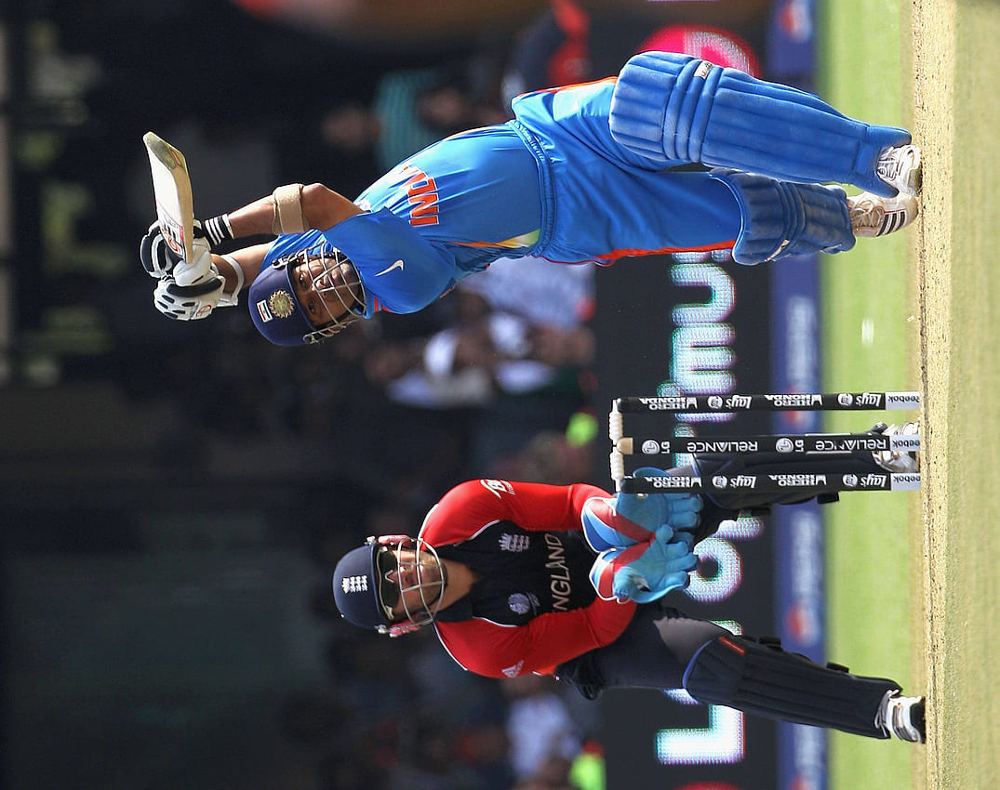

In [33]:
rot_img

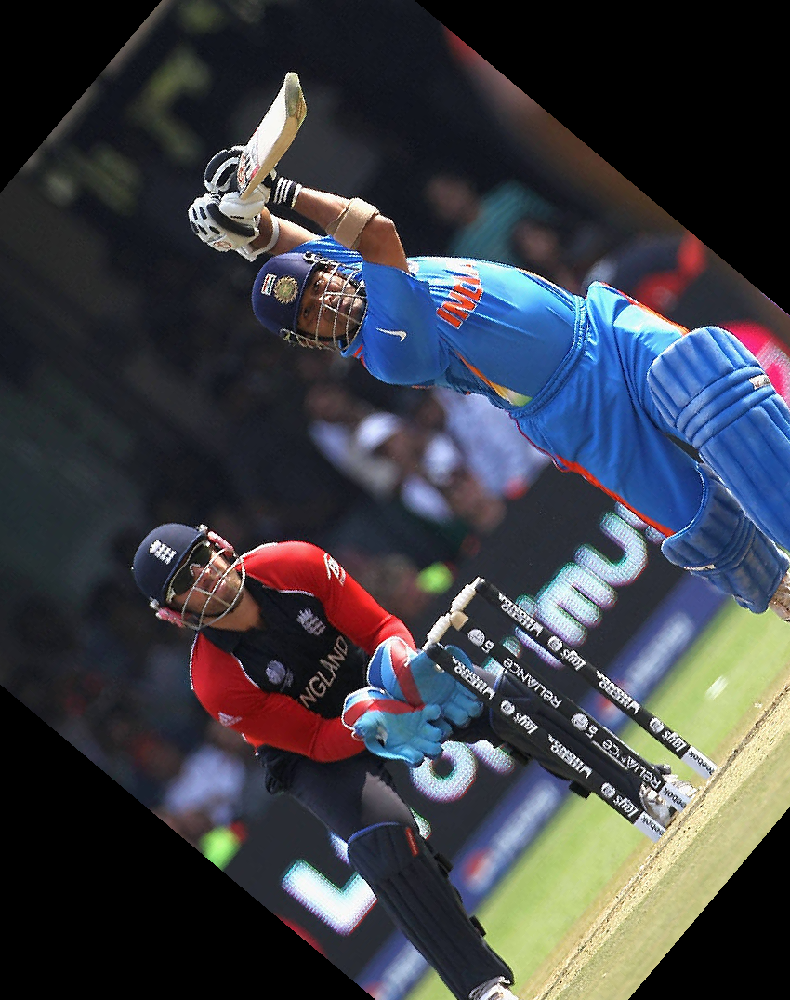

In [34]:
img_pil.rotate(50)  # general value

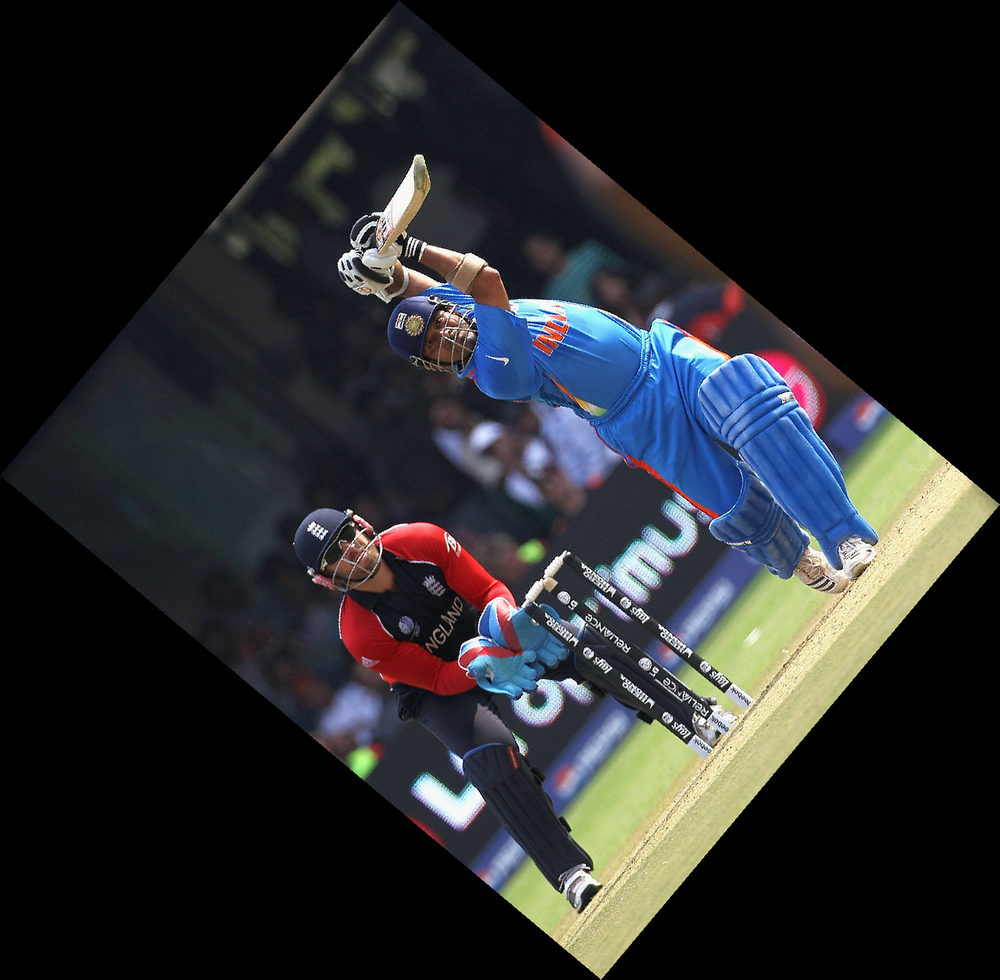

In [35]:
img_pil.rotate(50, expand=True)  #without loosing pixel

### Image Resizing 

In [36]:
help(cv2.resize)

Help on built-in function resize:

resize(...)
    resize(src, dsize[, dst[, fx[, fy[, interpolation]]]]) -> dst
    .   @brief Resizes an image.
    .
    .   The function resize resizes the image src down to or up to the specified size. Note that the
    .   initial dst type or size are not taken into account. Instead, the size and type are derived from
    .   the `src`,`dsize`,`fx`, and `fy`. If you want to resize src so that it fits the pre-created dst,
    .   you may call the function as follows:
    .   @code
    .       // explicitly specify dsize=dst.size(); fx and fy will be computed from that.
    .       resize(src, dst, dst.size(), 0, 0, interpolation);
    .   @endcode
    .   If you want to decimate the image by factor of 2 in each direction, you can call the function this
    .   way:
    .   @code
    .       // specify fx and fy and let the function compute the destination image size.
    .       resize(src, dst, Size(), 0.5, 0.5, interpolation);
    .   @endcode
   

In [37]:
resized_image = cv2.resize(img,(500,700))

In [38]:
cv2.imshow('resized image', resized_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Image Scaling

In [39]:
rescaled_image = cv2.resize(img, None, fx=0.5, fy=0.5)

In [40]:
cv2.imshow('resized image', rescaled_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [41]:
rescaled_image = cv2.resize(img, None, fx=0.75, fy=0.80)

cv2.imshow('resized image', rescaled_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [42]:
rescaled_image.shape

(860, 638, 3)

In [43]:
resized_image.shape

(700, 500, 3)

Resizing using PIL

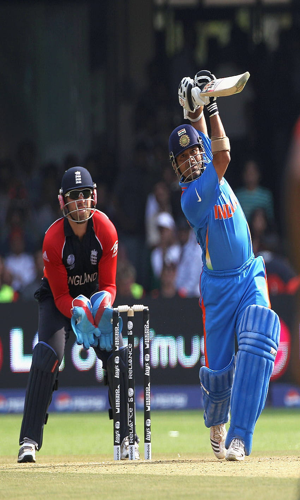

In [44]:
img_pil.resize((300,500))

#### Resizing using skimage

In [45]:
from skimage.transform import resize
import matplotlib.pyplot as plt

In [46]:
img_ski = plt.imread('sachin.jpg')

In [47]:
res_img = resize(img_ski,(400,250))

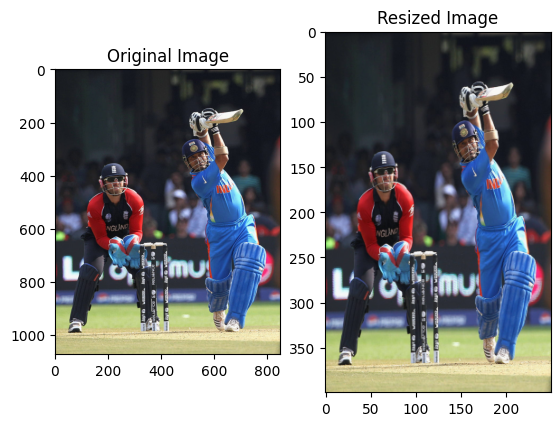

In [48]:
plt.subplot(1,2,1)
plt.title('Original Image')
plt.imshow(img_ski)
plt.subplot(1,2,2)
plt.title('Resized Image')
plt.imshow(res_img)

## Image FLipping

In [49]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# horizontal flip
fip_hor = cv2.flip(img_rgb, 0)

#vertical flip
fip_ver = cv2.flip(img_rgb, 1)

#diagonal flip
fip_dia = cv2.flip(img_rgb, -1)

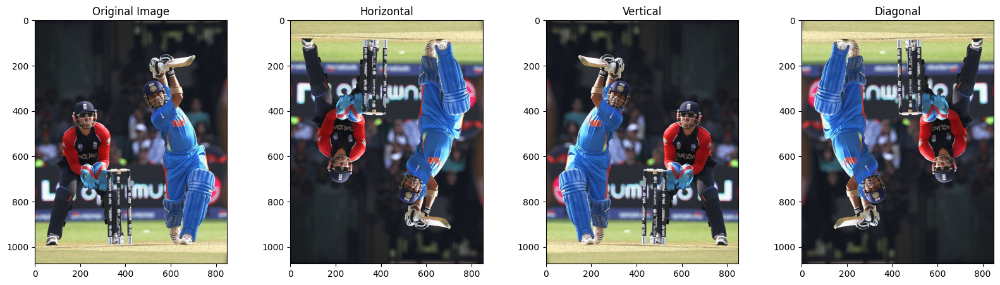

In [50]:
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
plt.title('Original Image')
plt.imshow(img_rgb)
plt.subplot(1,4,2)
plt.title('Horizontal')
plt.imshow(fip_hor)
plt.subplot(1,4,3)
plt.title('Vertical')
plt.imshow(fip_ver)
plt.subplot(1,4,4)
plt.title('Diagonal')
plt.imshow(fip_dia)

# Cropping

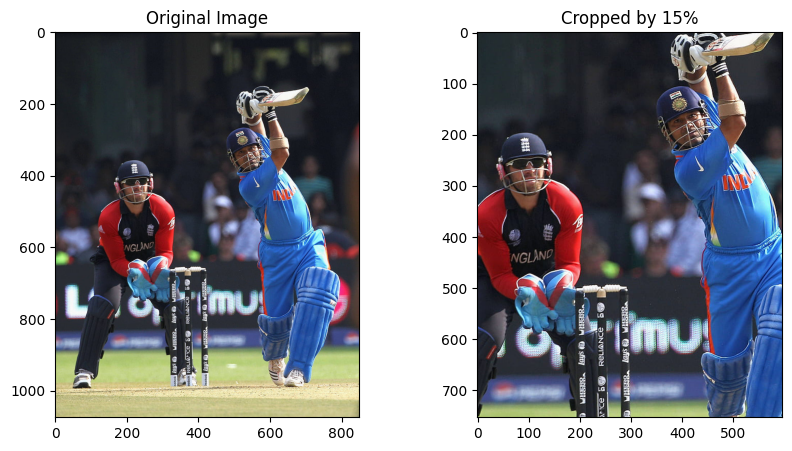

In [51]:
#Crop Image by 15%

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

image = Image.open('sachin.jpg')
image_array = np.array(image)

height, width, _ = image_array.shape
w = int(width * 0.15)  # 15% of width
h = int(height * 0.15)  # 15% of height

cropped_image = image_array[h:height-h, w:width-w]

cropped_image = Image.fromarray(cropped_image)

plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Image")

# Cropped Image
plt.subplot(1, 2, 2)
plt.imshow(cropped_image)
plt.title("Cropped by 15%")

plt.show()


In [52]:
## another method

In [53]:
height,width, _ = img_rgb.shape

In [54]:
startRow = int(height*0.15)
startCol = int(width*0.15)
endRow = int(height*0.85)
endCol = int(width*0.85)

In [55]:
croppedImage = img_rgb[startRow:endRow, startCol:endCol]

Text(0.5, 1.0, 'Cropped Image')

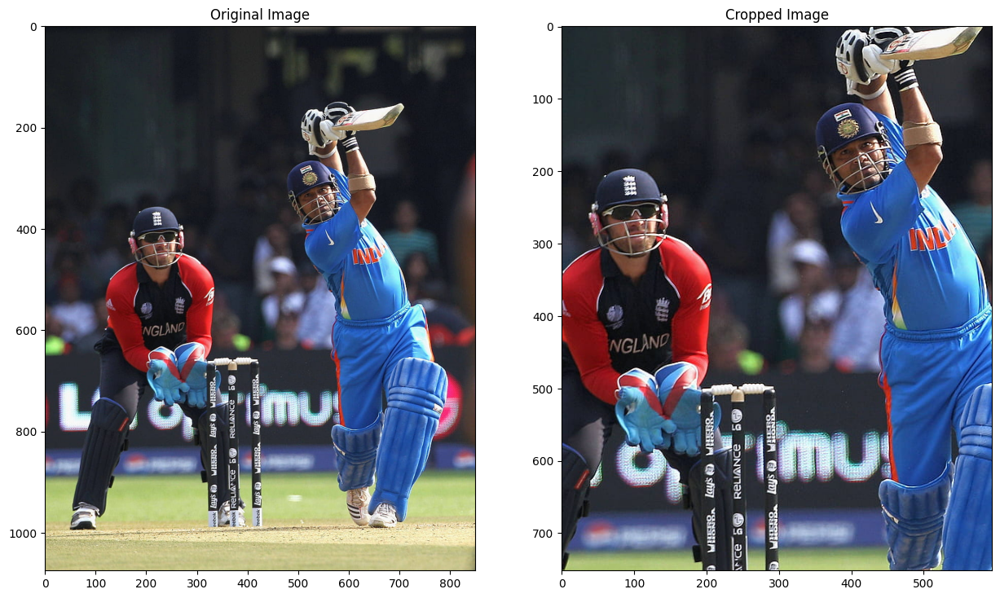

In [57]:
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.subplot(1,2,2)
plt.imshow(croppedImage)
plt.title("Cropped Image")

In [58]:
# Setting Value Manually

In [59]:
croppedImage = img_rgb[100:500, 150:600]

Text(0.5, 1.0, 'Cropped Image')

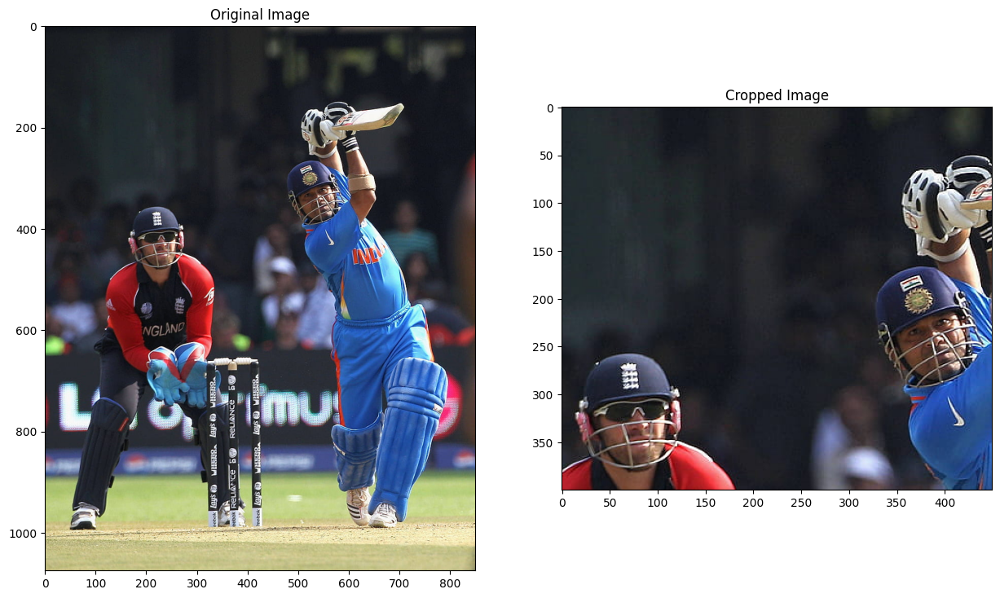

In [62]:
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.subplot(1,2,2)
plt.imshow(croppedImage)
plt.title("Cropped Image")

In [63]:
#Using PIL

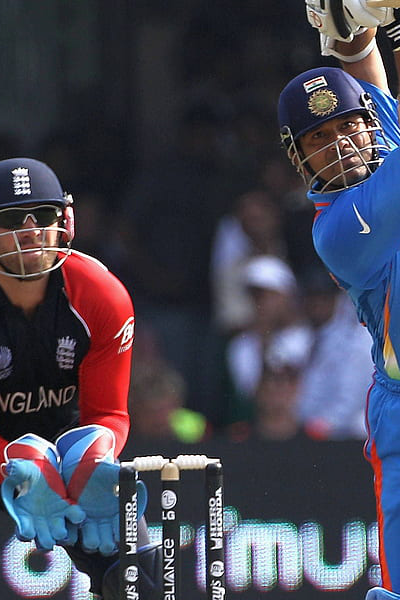

In [64]:
img_pil.crop((200,200,600,800))   #(x1,y1,x2,y2)

### Image Shearing

In [65]:
#tilt can be corrected by this method

In [66]:
shear_x = 0.25
shear_y = 0.40

M = np.array([[1, shear_x, 0],
              [shear_y,1,0],
              [0,0,1]])

In [67]:
M

array([[1.  , 0.25, 0.  ],
       [0.4 , 1.  , 0.  ],
       [0.  , 0.  , 1.  ]])

In [68]:
img_shear = cv2.warpPerspective(img, M, (width, height))

In [69]:
cv2.imshow('sheared image', img_shear)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [70]:
# Tilting negative signs

In [71]:
shear_x = -0.25   # shearing on x-axis
shear_y = 0.40    # shearing on y-axis

M = np.array([[1, shear_x, 0],  
              [shear_y,1, 0],
              [0, 0, 1]])

img_shear = cv2.warpPerspective(img, M, (width, height))

cv2.imshow('sheared image', img_shear)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [72]:
img_res = cv2.resize(img, (500,600))
img_shear = cv2.warpPerspective(img_res, M, (width, height))

cv2.imshow('sheared image', img_shear)
cv2.waitKey(0)   


-1

Affine Transformation

In [73]:
tx = 50         #translation-x
ty = 100           #translation-y
angle = 45       #rotation
scale = 0.8        #scaling factor
shear_x = 0.25     # tilt on x axis
shear_y = 0.3      # tilt on y axis

#define the affine transformation matrix
M = np.float32([[scale*np.cos(np.radians(angle)), shear_x, tx],
                [shear_y, scale*np.sin(np.radians(angle)), ty]])

In [74]:
M

array([[  0.56568545,   0.25      ,  50.        ],
       [  0.3       ,   0.56568545, 100.        ]], dtype=float32)

In [77]:
img_new = cv2.warpAffine(img, M, (width, height))

In [78]:
cv2.imshow('final image', img_new)
cv2.waitKey(0)
cv2.destroyAllWindows()